In [ ]:
! pip install cartopy, xarray, netcdf4, matplotlib, numpy

In [1]:
import matplotlib
import matplotlib.colors as mcolors
from matplotlib import patches
from matplotlib.gridspec import GridSpec
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import NullFormatter, FixedLocator, FormatStrFormatter, MultipleLocator

import datetime
import numpy as np
import pandas as pd
import xarray as xr
from pathlib import Path

In [2]:
events_categories = ["Warmextremes", "Rainextremes"]
resolution = 1.50
threshold = 0.001
year = 2020
model_list_heatwave = ["hres", "hres_ens","hres_ens_mean", 
               "pangu-oper","graphcast-oper", "pangu", "graphcast","fuxi"]
model_list_rainfall = ["hres", "hres_ens","hres_ens_mean", "graphcast-oper","graphcast",  "fuxi"]

model_full_name = {"graphcast": "GraphCast", "graphcast-oper": "GraphCast (oper.)",
                      "pangu": "Pangu-Weather", "pangu-oper": "Pangu-Weather (oper.)",
                      "hres": "IFS HRES", "hres_ens": "IFS ENS", "hres_ens_mean": "IFS ENS Mean",
                      "era5-forecast": "ERA5 Forecasts",
                      "fuxi": "FuXi"}

metric_name_dict = {'heidke_skill_score': "HSS", "hanssen_and_kuipers_discriminant": "PSS",
                    "gilberts_skill_score": "GSS", "f1_score": "F1 score", "accuracy": "Accuracy",
                    "symmetric_extremal_dependence_index": "SEDI","extremal_dependence_index": "EDI",
                    "symmetric_extreme_dependency_score": "SEDS","extreme_dependency_score": "EDS",
                    "hit_rate": "Sensitivity","false_alarm_rate": "False alarm rate", "true_negative_rate": "Specificity",
                    "success_ratio": "SR", "threat_score": "Threat score",
                    "odds_ratio": "Odds ratio", "odds_ratio_skill_score": "ORSS",
                    "bias_score": "Bias score", "threat_score": "CSI",
                    "brier_score": "Brier score", "AUC":"AUC", "ROCSS": "ROCSS"
                   }

# work_dir = Path("/content/drive/MyDrive/WB2BinaryForecast/")
work_dir = Path.cwd()

# Define the necessary functions

In [ ]:
def extreme_dependency_score(self) -> xr.DataArray:
    score = (
        np.log(self.base_rate()) 
        - np.log(self.probability_of_detection())
    ) / (
        np.log(self.base_rate())
        + np.log(self.probability_of_detection())
    )
    return score

def symmetric_extreme_dependency_score(self) -> xr.DataArray:
    score = (
        np.log(self.forecast_rate()) 
        - np.log(self.probability_of_detection())
    ) / (
        np.log(self.base_rate())
        + np.log(self.probability_of_detection())
    )
    return score

def extremal_dependence_index(self) -> xr.DataArray:
    score = (
        np.log(self.probability_of_false_detection())
        - np.log(self.probability_of_detection())
    ) / (
        np.log(self.probability_of_false_detection())
        + np.log(self.probability_of_detection())
    )
    return score

def symmetric_extremal_dependence_index(self) -> xr.DataArray:
    score = (
        np.log(self.probability_of_false_detection())
        - np.log(self.probability_of_detection())
        + np.log(1 - self.probability_of_detection())
        - np.log(1 - self.probability_of_false_detection())
    ) / (
        np.log(self.probability_of_false_detection())
        + np.log(self.probability_of_detection())
        + np.log(1 - self.probability_of_detection())
        + np.log(1 - self.probability_of_false_detection())
    )
    return score

In [ ]:
import scores

scores.categorical.BasicContingencyManager.extreme_dependency_score = extreme_dependency_score
scores.categorical.BasicContingencyManager.symmetric_extreme_dependency_score = symmetric_extreme_dependency_score
scores.categorical.BasicContingencyManager.extremal_dependence_index = extremal_dependence_index

def add_new_categorical_metrics(metrics_data):
    counts = {'tp_count': metrics_data["TP"],
              'tn_count': metrics_data["TN"],
              'fp_count': metrics_data["FP"],
              'fn_count': metrics_data["FN"],
              'total_count': metrics_data["Count"]}
    contingency_manager = scores.categorical.BasicContingencyManager(counts)
    
    # contingency_manager.extreme_dependency_score = extreme_dependency_score
    # contingency_manager.symmetric_extreme_dependency_score = symmetric_extreme_dependency_score
    # contingency_manager.extremal_dependence_index = extremal_dependence_index
    
    
    metrics_data["accuracy"] = contingency_manager.accuracy()
    metrics_data["bias_score"] = contingency_manager.bias_score()
    metrics_data["hit_rate"] = contingency_manager.hit_rate()
    metrics_data["false_alarm_rate"] = contingency_manager.false_alarm_rate()
    metrics_data["success_ratio"] = contingency_manager.success_ratio()
    metrics_data["f1_score"] = contingency_manager.f1_score()
    metrics_data["false_alarm_ratio"] = contingency_manager.false_alarm_ratio()
    metrics_data["threat_score"] = contingency_manager.threat_score()
    metrics_data["specificity"] = contingency_manager.specificity()
    metrics_data["odds_ratio"] = contingency_manager.odds_ratio()
    metrics_data["odds_ratio_skill_score"] = contingency_manager.odds_ratio_skill_score()
    
    metrics_data["hanssen_and_kuipers_discriminant"] = contingency_manager.hanssen_and_kuipers_discriminant()
    metrics_data["gilberts_skill_score"] = contingency_manager.gilberts_skill_score()
    metrics_data["heidke_skill_score"] = contingency_manager.heidke_skill_score()
    
    metrics_data["extreme_dependency_score"] = contingency_manager.extreme_dependency_score()
    metrics_data["symmetric_extreme_dependency_score"] = contingency_manager.symmetric_extreme_dependency_score()
    metrics_data["extremal_dependence_index"] = contingency_manager.extremal_dependence_index()
    metrics_data["symmetric_extremal_dependence_index"] = contingency_manager.symmetric_extremal_dependence_index()
    metrics_data["true_negative_rate"] = contingency_manager.true_negative_rate()
    return metrics_data

# Metrics selection

In [ ]:
tx24h_results = xr.open_dataset(work_dir/"Metrics/Metrics_tx24h_region_table.nc")
tp24h_results = xr.open_dataset(work_dir/"Metrics/Metrics_tp24h_region_table.nc")

In [ ]:
tx24h_results = add_new_categorical_metrics(tx24h_results)
tp24h_results = add_new_categorical_metrics(tp24h_results)

In [ ]:
metrics_tx24h_region = xr.open_dataset(work_dir / "Metrics" / "Metrics_tx24h_region_bs_roc.nc")
metrics_tp24h_region = xr.open_dataset(work_dir / "Metrics" / "Metrics_tp24h_region_bs_roc.nc")

In [ ]:
tx24h_results = xr.merge([metrics_tx24h_region, tx24h_results])
tp24h_results = xr.merge([metrics_tp24h_region, tp24h_results])

In [ ]:
tp24h_results

<xarray.Dataset>
Dimensions:                              (quantile: 9, lead_time: 10,
                                          model_name: 6, region: 13)
Coordinates:
  * quantile                             (quantile) float64 0.8 0.85 ... 0.99
  * lead_time                            (lead_time) int64 1 2 3 4 5 6 7 8 9 10
  * model_name                           (model_name) <U14 'fuxi' ... 'hres_e...
  * region                               (region) <U19 'global' ... 'antarctic'
    prediction_timedelta                 (lead_time) timedelta64[ns] 1 days ....
Data variables: (12/27)
    AUC                                  (region, model_name, lead_time, quantile) float64 ...
    BS                                   (region, model_name, lead_time, quantile) float64 ...
    ROCSS                                (region, model_name, lead_time, quantile) float64 ...
    TP                                   (region, model_name, lead_time, quantile) float64 ...
    TN                                   (region, model_name, lead_time, quantile) float64 ...
    FP                                   (region, model_name, lead_time, quantile) float64 ...
    ...                                   ...
    heidke_skill_score                   (region, model_name, lead_time, quantile) float64 ...
    extreme_dependency_score             (region, model_name, lead_time, quantile) float64 ...
    symmetric_extreme_dependency_score   (region, model_name, lead_time, quantile) float64 ...
    extremal_dependence_index            (region, model_name, lead_time, quantile) float64 ...
    symmetric_extremal_dependence_index  (region, model_name, lead_time, quantile) float64 ...
    true_negative_rate                   (region, model_name, lead_time, quantile) float64 ...

In [ ]:
tx24h_results

<xarray.Dataset>
Dimensions:                              (quantile: 9, lead_time: 10,
                                          model_name: 9, region: 13)
Coordinates:
  * quantile                             (quantile) float64 0.8 0.85 ... 0.99
  * lead_time                            (lead_time) int64 1 2 3 4 5 6 7 8 9 10
  * model_name                           (model_name) <U14 'era5-forecast' .....
  * region                               (region) <U19 'global' ... 'antarctic'
Data variables: (12/27)
    AUC                                  (region, model_name, lead_time, quantile) float64 ...
    BS                                   (region, model_name, lead_time, quantile) float64 ...
    ROCSS                                (region, model_name, lead_time, quantile) float64 ...
    TP                                   (region, model_name, lead_time, quantile) float64 ...
    TN                                   (region, model_name, lead_time, quantile) float64 ...
    FP                                   (region, model_name, lead_time, quantile) float64 ...
    ...                                   ...
    heidke_skill_score                   (region, model_name, lead_time, quantile) float64 ...
    extreme_dependency_score             (region, model_name, lead_time, quantile) float64 ...
    symmetric_extreme_dependency_score   (region, model_name, lead_time, quantile) float64 ...
    extremal_dependence_index            (region, model_name, lead_time, quantile) float64 ...
    symmetric_extremal_dependence_index  (region, model_name, lead_time, quantile) float64 ...
    true_negative_rate                   (region, model_name, lead_time, quantile) float64 ...

In [ ]:
a = list(range(16))
# a.remove(3)
# a = [3]+a
colors = [plt.get_cmap('tab20')(i) for i in a]

In [ ]:
events_categories = ["Wet extremes", "Warm extremes"]
events_definitions = {"Warm extremes": "24h maximum 2m temperature $\mathrm{\geq}$ 90th percentile", 
                      "Wet extremes": "24h precipitation $\mathrm{\geq}$ 90th percentile"}

data = {"Warm extremes":tx24h_results, "Wet extremes":tp24h_results}

## metrics

In [ ]:
metric_name_dict = {'heidke_skill_score': "HSS", "hanssen_and_kuipers_discriminant": "PSS",
                    "specificity": "TNR",
                    "gilberts_skill_score": "GSS", "f1_score": "F1 score", "accuracy": "ACC",
                    "symmetric_extremal_dependence_index": "SEDI","extremal_dependence_index": "EDI",
                    "symmetric_extreme_dependency_score": "SEDS","extreme_dependency_score": "EDS",
                    "hit_rate": "H","false_alarm_rate": "F", "true_negative_rate": "Specificity",
                    "success_ratio": "SR", "threat_score": "Threat score",
                    "odds_ratio": "Odds ratio", "odds_ratio_skill_score": "ORSS",
                    "bias_score": "Bias score", "threat_score": "CSI",
                    "AUC": "AUC", "BS": "1 - BS", "ROCSS":"ROCSS",
                   }

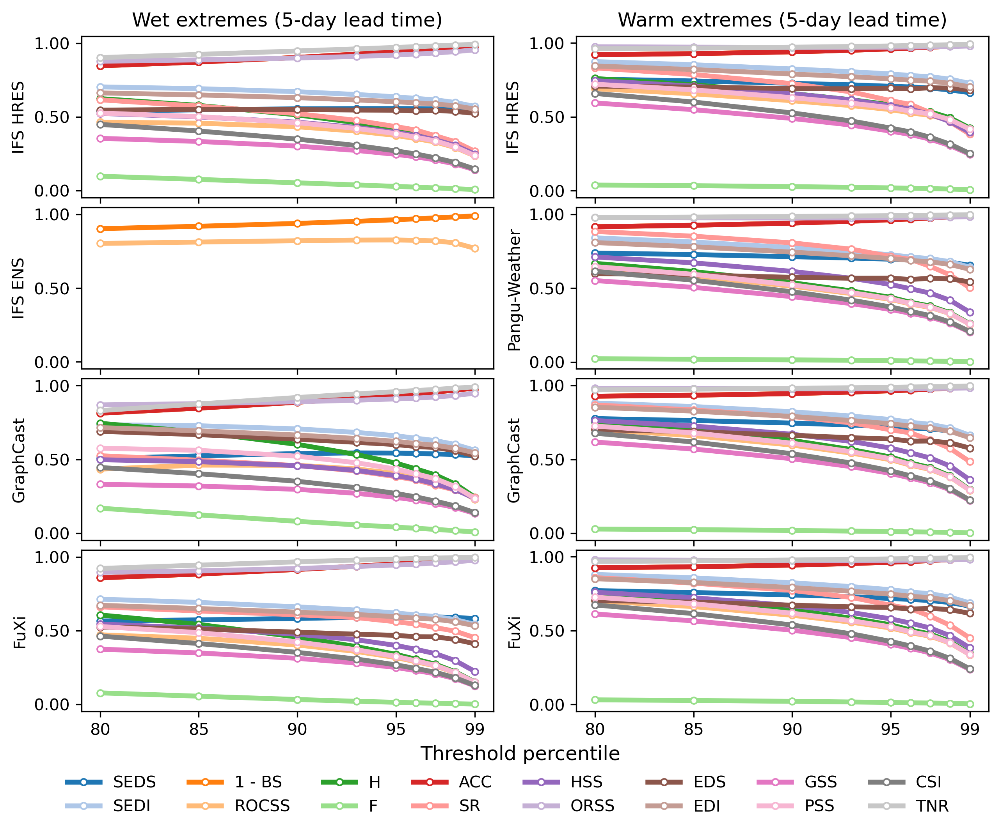

In [ ]:
lead_time = 5

fig, axes = plt.subplots(4, 2, figsize=(10, 7.5), dpi=300, sharey="col",sharex="all")
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.2, 
                    hspace=0.06)

for j, event in enumerate(events_categories):
    results = data[event]
    models = ["hres", "pangu", "graphcast", "fuxi"] if j ==1 else ['hres', 'hres_ens', 'graphcast', 'fuxi']
    for i, model_name in enumerate(models):
    
        ax = axes[i][j]
        for k, metric_name in enumerate([
            "symmetric_extreme_dependency_score", "symmetric_extremal_dependence_index",  
             "BS","ROCSS", #"hit_rate",
            "hit_rate","false_alarm_rate",
            "accuracy", "success_ratio", 
            "heidke_skill_score","odds_ratio_skill_score",
            "extreme_dependency_score", "extremal_dependence_index",
            "gilberts_skill_score", "hanssen_and_kuipers_discriminant",
            "threat_score", "specificity"
            #"bias_score", "false_alarm_rate",
             
                           ]):
            metric_quantile_data = results[metric_name].sel(
                region="global", lead_time=lead_time, model_name=model_name)
            if metric_name == "BS":
                metric_quantile_data = 1 - metric_quantile_data
            # print(model_name, metric_name_dict[metric_name], metric_quantile_data.data)
            ax.plot(metric_quantile_data["quantile"]*100, metric_quantile_data,
                    lw=3, color=colors[k], #markeredgecolor= "k", 
                    marker="o", markersize=4, markerfacecolor= "white", 
                    label=metric_name_dict[metric_name])
        ax.set_xticks([80, 85, 90, 95, 99])
        ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
        # ax.xaxis.set_major_formatter(FormatStrFormattertrFormatter('%.0f'))
        ax.set_title(f"{event} ({lead_time}-day lead time)") if i == 0 else 0
        ax.set_ylabel(model_full_name[model_name])

axes[3][1].legend(frameon=False, loc=(-1.25, -0.68), ncols=8)
fig.supxlabel("Threshold percentile", y=0.05)
# fig.supylabel("Measure", x=0.04)
fig.savefig("Figures/Lineplot_tx24h_tp24h_metrics_thresholds_ens.jpg", dpi=300, bbox_inches="tight")

## models

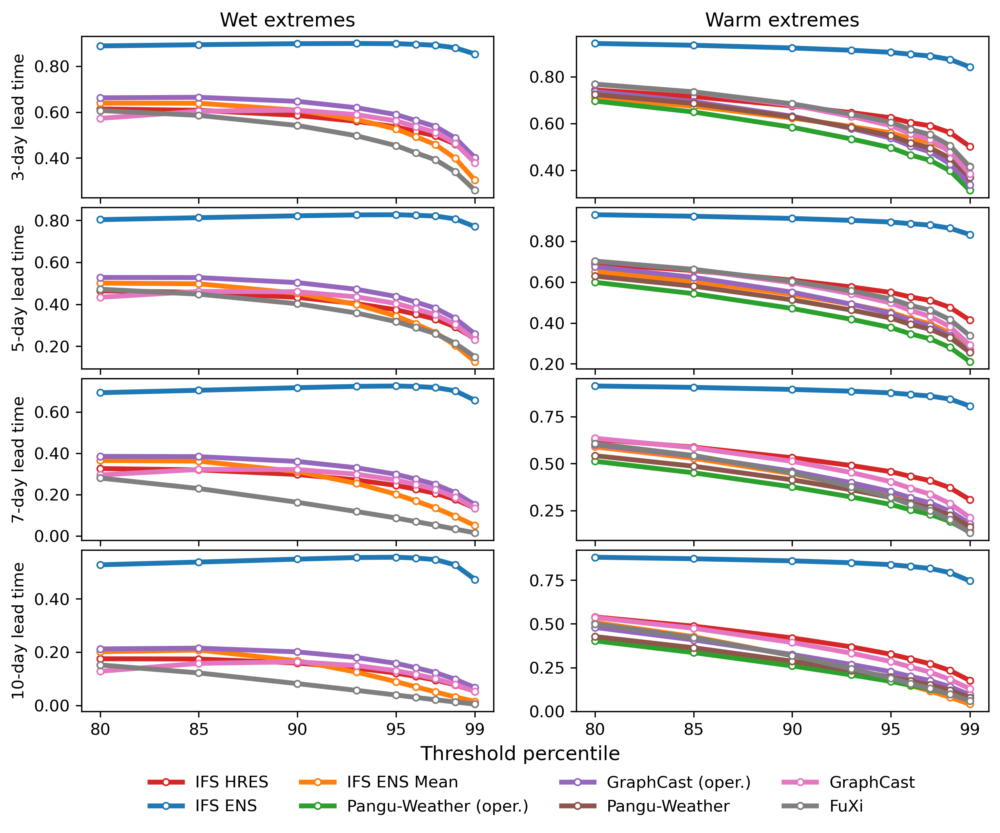

In [ ]:
lead_times = [3, 5, 7, 10]
metric_name = "ROCSS"
a = list(range(8))
a.remove(3)
a = [3]+a
colors = [plt.get_cmap('tab10')(i) for i in a]

fig, axes = plt.subplots(4, 2, figsize=(10, 7.5), dpi=300, sharex="all")
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.2, 
                    hspace=0.06)
for j, event in enumerate(events_categories):
    results = data[event]
    for i, lead_time in enumerate(lead_times):
        ax = axes[i][j]
        # for k, model_name in enumerate(["hres", "pangu", "graphcast", "fuxi"]):
        for k, model_name in enumerate(['hres','hres_ens',"hres_ens_mean",#'era5-forecast',
                                        'pangu-oper','graphcast-oper','pangu','graphcast',
                                        'fuxi',]):
            if (j == 0) and (model_name not in model_list_rainfall):
                continue
            metric_quantile_data = results[metric_name].sel(
                region="global", lead_time=lead_time, model_name=model_name)
            # print(metric_quantile_data.data[-1]-metric_quantile_data.data[0])
            # if lead_time == 5:
            #     print(model_name, metric_quantile_data.data)
            ax.plot(metric_quantile_data["quantile"]*100, metric_quantile_data,
                    lw=3, color=colors[k], #markeredgecolor= "k", 
                    marker="o", markersize=4, markerfacecolor= "white", 
                    label=model_full_name[model_name])
        ax.set_xticks([80, 85, 90, 95, 99])
        ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
        # ax.xaxis.set_major_formatter(FormatStrFormattertrFormatter('%.0f'))
        ax.set_title(f"{event}") if i == 0 else 0
        ax.set_ylabel(f"{lead_time}-day lead time") if j == 0 else 0
        # ax.set_ylabel(metric_name_dict[metric_name]) if j == 0 else 0
        
# axes[0][0].legend(frameon=False, loc=(0.05, 0.35))
axes[3][1].legend(frameon=False, loc=(-1.05, -0.68), ncols=4)
fig.supxlabel("Threshold percentile", y=0.05)
# fig.supylabel("Measure", x=0.04)
fig.savefig("Figures/Lineplot_tx24h_tp24h_models_thresholds_ROCSS2.jpg", dpi=300, bbox_inches="tight")

# Scorecards

In [3]:
def add_white_lines(ax, data, relative=None, significant=None):
    img = data
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            if significant is None:
                # color = '#E9E9E9'
                color = "white"
                linewidth = 3
            else:
                if significant[i, j] == 1:
                    color="k"
                    color = "#9B0F27" if relative[i, j] > 0 else "#185695"
                    # color = "red" if relative[i, j] > 0 else "blue"
                    
                    # color = ListedColormap(plt.get_cmap('RdBu_r')(np.linspace(0,1,levels+2))[-1]) if relative[i, j] > 0 else ListedColormap(plt.get_cmap('RdBu_r')(np.linspace(0,1,levels+2))[1])
                    # color = "black"
                    linewidth = 3
                else:
                    # color = '#E9E9E9'
                    color = "white"
                    linewidth = 3
            
            rect = patches.Rectangle(
                (j - 0.45, i - 0.45), 0.90, 0.90, linewidth=linewidth,
                edgecolor=color, facecolor='None',)
            ax.add_patch(rect)
            ax.text(j, i, "{:.2f}".format(data[i, j]), ha="center", va="center", 
                    fontsize=8, color="k")
            rect = patches.Rectangle(
                (j - 0.49, i - 0.49), 0.98, 0.98, linewidth=1,
                edgecolor="white", facecolor='None',)
            ax.add_patch(rect)
            
def set_x_labels(ax, xlabels, color='0.7'):
    ax.set_xticks(range(len(xlabels)))
    ax.set_xticklabels(xlabels)
    ax.spines['top'].set_color(color)
    ax.spines['right'].set_color(color)
    ax.spines['bottom'].set_color(color)
    ax.spines['left'].set_color(color)  
    
def set_y_labels(ax, color='0.7'):
    ax.set_xticks([])
    ax.set_yticks([])
    # ax.tick_params(axis='y', color='None')
    # ax.set_yticklabels(['000'], color='None')

    ax.spines['top'].set_color(color)
    ax.spines['right'].set_color(color)
    ax.spines['bottom'].set_color(color)
    ax.spines['left'].set_color(color)

In [4]:
quantile = 0.9
tp24h_results = xr.open_dataset(work_dir/"Metrics/Metrics_tp24h_region_bs_roc.nc").sel(quantile=quantile)
tx24h_results = xr.open_dataset(work_dir/"Metrics/Metrics_tx24h_region_bs_roc.nc").sel(quantile=quantile)

In [5]:
tx24h_results

<xarray.Dataset>
Dimensions:     (lead_time: 10, model_name: 9, region: 13)
Coordinates:
    quantile    float64 0.9
  * lead_time   (lead_time) int64 1 2 3 4 5 6 7 8 9 10
  * model_name  (model_name) <U14 'hres' 'hres_ens' ... 'graphcast' 'fuxi'
  * region      (region) <U19 'global' 'tropics' ... 'arctic' 'antarctic'
Data variables:
    AUC         (region, model_name, lead_time) float64 ...
    BS          (region, model_name, lead_time) float64 ...
    ROCSS       (region, model_name, lead_time) float64 ...

In [6]:
tp24h_significance = pd.read_csv(work_dir/"Metrics/Significant_region_tp24h.csv")
tx24h_significance = pd.read_csv(work_dir/"Metrics/Significant_region_tx24h.csv")

## Global weighted average

In [7]:
events_categories = ["Wet extremes", "Warm extremes"]
events_definitions = {"Warm extremes": "24h maximum 2m temperature $\mathrm{\geq}$ 90th percentile", 
                      "Wet extremes": "24h precipitation $\mathrm{\geq}$ 90th percentile"}

data = {"Warm extremes":tx24h_results, "Wet extremes":tp24h_results}

# lead_times = [1,3,5,7,10]
lead_times = range(1,11)
metric_name = "ROCSS"
significance_global = {"Warm extremes":tx24h_significance[
                    tx24h_significance["region_name"]=="global"].pivot_table(
                    index="model_name", columns="lead_time", values="significant",), 
                "Wet extremes":tp24h_significance[
                    tp24h_significance["region_name"]=="global"].pivot_table(
                    index="model_name", columns="lead_time", values="significant",)}

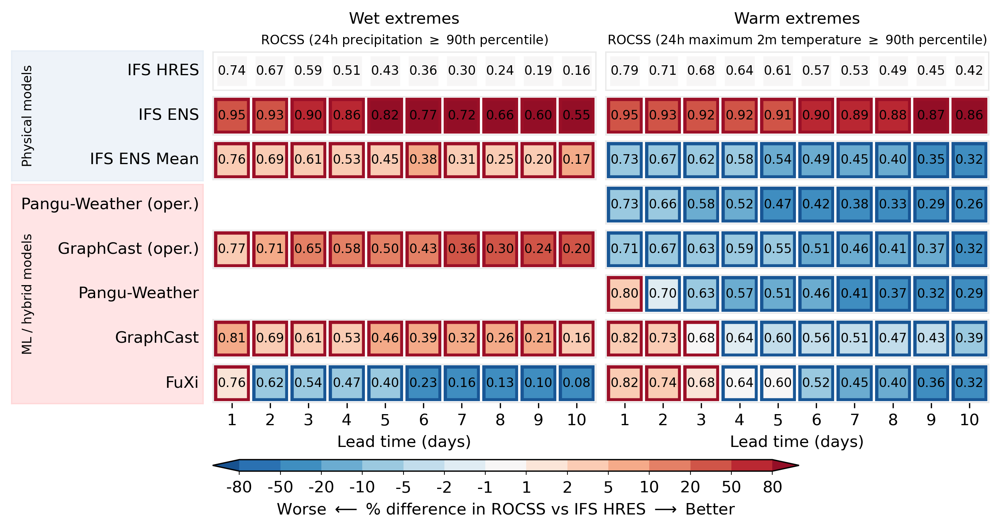

In [9]:
fig = plt.figure(figsize=(11, 4), dpi=300)
gs = GridSpec(len(model_list_heatwave), len(events_categories)+1, figure=fig, hspace=0.1, wspace=0.03,
        # left=0.1,right=0.9, top=0.9,bottom=0.1, 
              width_ratios=[1,2,2],
    )

# 设置分段colorbar
bounds = [-80, -50, -20, -10, -5, -2, -1, 1, 2, 5, 10, 20, 50, 80]
levels = len(bounds) + 1
norm = mcolors.BoundaryNorm(boundaries=bounds, ncolors=levels, extend="both")

cmap=plt.get_cmap('RdBu_r')
newcmap=ListedColormap(cmap(np.linspace(0, 1, levels+2))[1:-1])

# 左侧色块，区分 Physical models 和 ML / hybrid models
pm_ax = fig.add_subplot(gs[:3,0], facecolor="#EEF3F9",zorder=-999)
set_y_labels(pm_ax, "#E6EEF6")
pm_ax.set_ylabel("Physical models", fontsize=8)
pm_ax.yaxis.set_label_coords(0.12, 0.5)

ml_ax = fig.add_subplot(gs[3:,0], facecolor="#FFE4E5",zorder=-999)
set_y_labels(ml_ax, "#FFD7D8")
ml_ax.set_ylabel("ML / hybrid models", fontsize=8)
ml_ax.yaxis.set_label_coords(0.12, 0.5)

for j, event in enumerate(events_categories):
    axes = []
    for i, model_name in enumerate(model_list_heatwave):

        ax = fig.add_subplot(gs[i,j+1])
        axes.append(ax)
        if j == 0:
            ax.set_ylabel(model_full_name[model_name], rotation='horizontal', 
                          verticalalignment="center", horizontalalignment="right",
                          #x=0, #transform=ax.tansAxes
                          )
            ax.yaxis.set_label_coords(-0.035, 0.5)
        if model_name not in data[event].model_name:
            ax.set_xticks([])
            ax.set_yticks([])
            ax.spines["left"].set_visible(False)
            ax.spines["right"].set_visible(False)
            ax.spines["top"].set_visible(False)
            ax.spines["bottom"].set_visible(False)
            continue        
        model_data = data[event][metric_name].sel(model_name=[model_name], lead_time=lead_times, region="global").data
        hres_bench = data[event][metric_name].sel(model_name=["hres"], lead_time=lead_times, region="global").data

        relative = (model_data-hres_bench)/hres_bench * 100
        
        img = ax.imshow(relative, cmap=newcmap, norm=norm)
        # img = ax.imshow(relative, cmap='RdBu_r', vmin=-100, vmax=100)
        significance_data = None if model_name == "hres" else significance_global[event].loc[[model_name], :].values
        add_white_lines(ax, model_data, relative, significance_data)
        
        set_y_labels(ax, "#E9E9E9")

    set_x_labels(ax, lead_times, "#E9E9E9")
    ax.set_xlabel('Lead time (days)')
    
    axes[0].set_title(event, y=1.5, fontsize=10)
    axes[0].text(0.5, 1.3, f"{metric_name_dict[metric_name]} ({events_definitions[event]})", 
                    ha="center", va="center", transform=axes[0].transAxes,
                    fontsize=8, color="k")
    # axes[0].text(0.5, 1.3, f"{events_definitions[event]}", 
    #                 ha="center", va="center", transform=axes[0].transAxes,
    #                 fontsize=6, color="k")
    # axes[0].set_subtitle(event)
    if j == 0:
        axins = ax.inset_axes(bounds=[0, -1.8, 1.53, 0.3], transform=ax.transAxes,)
        cbar = fig.colorbar(img, ticks=bounds, boundaries=bounds, format='%.0f',
                            cax=axins, orientation='horizontal', extend="both")
        # cbar.ax.set_xlabel(r"Worse $\mathrm{\longleftarrow}$ % difference in " + metric_name_dict[metric_name] + \
        #                    " vs IFS HRES $\mathrm{\longrightarrow}$ Better", fontsize=10)
        cbar.ax.set_xlabel(r"Worse $\mathrm{\longleftarrow}$ % difference in " +metric_name_dict[metric_name] + " vs IFS HRES $\mathrm{\longrightarrow}$ Better", fontsize=10)
        cbar.ax.tick_params(direction="out",width=.5,length=2.5)

fig.savefig(f"Figures/ScoreCards_tx24h_tp24h_{metric_name_dict[metric_name]}_significance2.jpg",dpi=300, bbox_inches="tight")

## Region

In [10]:
regions = {'northern-hemisphere': "Northern Hemisphere",'southern-hemisphere':'Southern Hemisphere', 
           'tropics': "Tropics", 'extra-tropics': "Extra-Tropics", 
           'arctic': "Arctic", 'antarctic': "Antarctic",
           'europe': "Europe", 'north-america': 'North America', 
           'north-atlantic':'North Atlantic', 'north-pacific': 'North Pacific', 
           'east-asia': 'East Asia', 'ausnz': "AusNZ", }

lead_times = [1,3,5,7,10]
metric_name = "ROCSS"

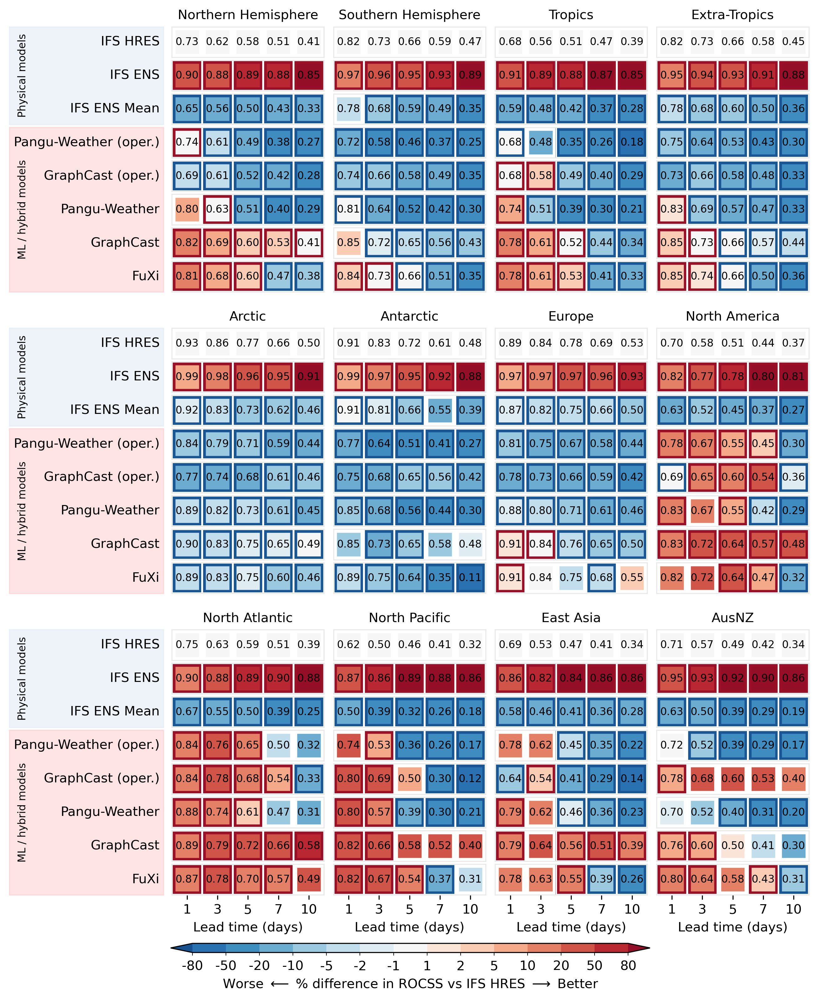

In [15]:
fig = plt.figure(figsize=(11, 12), dpi=300)
gs = GridSpec(26, 5,figure=fig, hspace=0.1, wspace=0.05,
              # left=0.1,right=0.9, top=0.9,bottom=0.1, width_ratios=[1,4],
    )

bounds = [-80, -50, -20, -10, -5, -2, -1, 1, 2, 5, 10, 20, 50, 80]
levels = len(bounds) + 1
norm = mcolors.BoundaryNorm(boundaries=bounds, ncolors=levels, extend="both")

cmap=plt.get_cmap('RdBu_r')
newcmap=ListedColormap(cmap(np.linspace(0,1,levels+2))[1:-1])

for i in range(3):
    pm_ax = fig.add_subplot(gs[9*i:9*i+3,0], facecolor="#EEF3F9",zorder=-999)
    set_y_labels(pm_ax, "#E6EEF6")
    pm_ax.set_ylabel("Physical models", fontsize=8)
    pm_ax.yaxis.set_label_coords(0.12, 0.5)

    ml_ax = fig.add_subplot(gs[9*i+3:9*i+8,0], facecolor="#FFE4E5",zorder=-999)
    set_y_labels(ml_ax, "#FFD7D8")
    ml_ax.set_ylabel("ML / hybrid models", fontsize=8)
    ml_ax.yaxis.set_label_coords(0.12, 0.5)

axes = []
for j,(region, region_name) in enumerate(regions.items()):
    significance_region = tx24h_significance[
        tx24h_significance["region_name"]==region].pivot_table(
            index="model_name", columns="lead_time", values="significant",)
    for i, model_name in enumerate(model_list_heatwave):
        ax = fig.add_subplot(gs[i+j//4 * 9,1+j-j//4*4])
        axes.append(ax)
        
        model_data = tx24h_results[metric_name].sel(model_name=[model_name], lead_time=lead_times, region=region).data
        hres_bench = tx24h_results[metric_name].sel(model_name=["hres"], lead_time=lead_times, region=region).data

        relative = (model_data-hres_bench)/hres_bench * 100
        img = ax.imshow(relative, cmap=newcmap, norm=norm)
        
        significance_data = None if model_name == "hres" else significance_region.loc[[model_name], :].values
        add_white_lines(ax, model_data, relative, significance_data)
        
        set_y_labels(ax,  "#E9E9E9")
        if 1+j-j//4*4 == 1:
            ax.set_ylabel(model_full_name[model_name], rotation='horizontal', 
                          verticalalignment="center", horizontalalignment="right",fontsize=10,
                          #x=0, #transform=ax.tansAxes
                          )
            ax.yaxis.set_label_coords(-0.08, 0.5)

        if model_name == "hres":
            ax.set_title(region_name, fontsize=10)
        if (model_name == "fuxi") and (region in ['north-atlantic', "north-pacific", 'ausnz', 'east-asia']):
            set_x_labels(ax, lead_times,  "#E9E9E9")
            ax.set_xlabel('Lead time (days)', fontsize=10)
#     axes[0].text(0.5, 1.25, "Precipitation > 1 mm/day", 
#                     ha="center", va="center", transform=axes[0].transAxes,
#                     fontsize=8, color="k")
#     # axes[0].set_subtitle(event)
        if (model_name == "fuxi") and (region == 'north-pacific'):
            axins = ax.inset_axes(bounds=[-1.07, -1.9, 3.15, 0.3], transform=ax.transAxes,)
            # axins = ax.inset_axes(bounds=[-0.55, -1.9, 3.15, 0.3], transform=ax.transAxes,)
            cbar = fig.colorbar(img, ticks=bounds, boundaries=bounds, format='%.0f',
                                cax=axins, orientation='horizontal', extend="both")
            # cbar.ax.set_xlabel(r"Better $\mathrm{\longleftarrow}$ % difference in " + metric_name_dict[metric_name] + \
            #                    " vs IFS HRES $\mathrm{\longrightarrow}$ Worse",
            #                   fontsize=10)
            # cbar.ax.set_xlabel(r"Worse $\mathrm{\longleftarrow}$ BSS (%) with HRES as reference forecasts $\mathrm{\longrightarrow}$ Better", fontsize=10)
            cbar.ax.set_xlabel(r"Worse $\mathrm{\longleftarrow}$ % difference in " +metric_name_dict[metric_name] + " vs IFS HRES $\mathrm{\longrightarrow}$ Better", fontsize=10)
            cbar.ax.tick_params(direction="out",width=.5,length=2.5)

fig.savefig(f"Figures/ScoreCards_tx24h_{metric_name_dict[metric_name]}_regions_significance2.jpg",dpi=300, bbox_inches="tight")

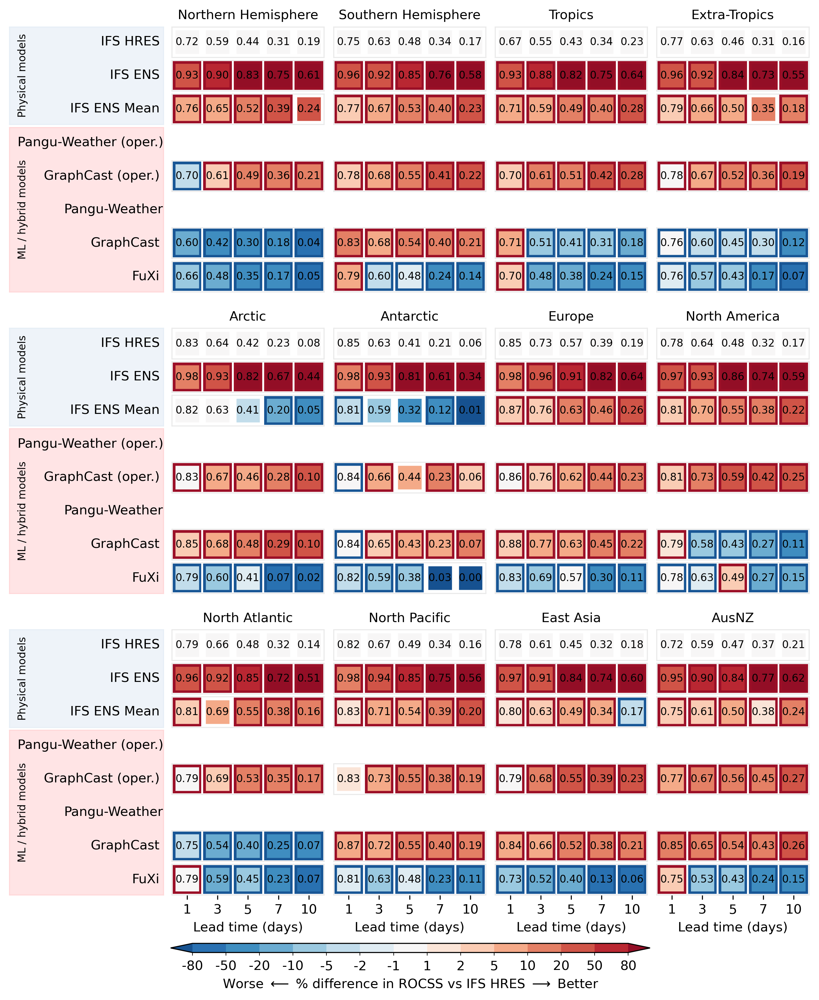

In [17]:
fig = plt.figure(figsize=(11, 12), dpi=300)
gs = GridSpec(26, 5,figure=fig, hspace=0.1, wspace=0.05,
              # left=0.1,right=0.9, top=0.9,bottom=0.1, width_ratios=[1,4],
    )

bounds = [-80, -50, -20, -10, -5, -2, -1, 1, 2, 5, 10, 20, 50, 80]
levels = len(bounds) + 1
norm = mcolors.BoundaryNorm(boundaries=bounds, ncolors=levels, extend="both")

cmap=plt.get_cmap('RdBu_r')
newcmap=ListedColormap(cmap(np.linspace(0,1,levels+2))[1:-1])

for i in range(3):
    pm_ax = fig.add_subplot(gs[9*i:9*i+3,0], facecolor="#EEF3F9",zorder=-999)
    set_y_labels(pm_ax, "#E6EEF6")
    pm_ax.set_ylabel("Physical models", fontsize=8)
    pm_ax.yaxis.set_label_coords(0.12, 0.5)

    ml_ax = fig.add_subplot(gs[9*i+3:9*i+8,0], facecolor="#FFE4E5",zorder=-999)
    set_y_labels(ml_ax, "#FFD7D8")
    ml_ax.set_ylabel("ML / hybrid models", fontsize=8)
    ml_ax.yaxis.set_label_coords(0.12, 0.5)

axes = []
for j,(region, region_name) in enumerate(regions.items()):
    significance_region = tp24h_significance[
        tp24h_significance["region_name"]==region].pivot_table(
            index="model_name", columns="lead_time", values="significant",)
    for i, model_name in enumerate(model_list_heatwave):

        ax = fig.add_subplot(gs[i+j//4 * 9, 1+j-j//4*4])
        axes.append(ax)
        if 1+j-j//4*4 == 1:
            ax.set_ylabel(model_full_name[model_name], rotation='horizontal', 
                          verticalalignment="center", horizontalalignment="right",
                          fontsize=10,
                          #x=0, #transform=ax.tansAxes
                          )
            ax.yaxis.set_label_coords(-0.08, 0.5)
        if model_name not in model_list_rainfall:
            # ax.set_visible(False)
            ax.set_xticks([])
            ax.set_yticks([])
            ax.spines["left"].set_visible(False)
            ax.spines["right"].set_visible(False)
            ax.spines["top"].set_visible(False)
            ax.spines["bottom"].set_visible(False)
            ax.yaxis.set_label_coords(-0.05, 0.5)
            continue
        model_data = tp24h_results[metric_name].sel(model_name=[model_name], lead_time=lead_times, region=region).data
        hres_bench = tp24h_results[metric_name].sel(model_name=["hres"], lead_time=lead_times, region=region).data

        relative = (model_data - hres_bench)/hres_bench * 100
        img = ax.imshow(relative, cmap=newcmap, norm=norm)
        significance_data = None if model_name == "hres" else significance_region.loc[[model_name], :].values
        add_white_lines(ax, model_data, relative, significance_data)
        set_y_labels(ax, "#E9E9E9")

    
        if model_name == "hres":
            ax.set_title(region_name, fontsize=10)
        if (model_name == "fuxi") and (region in ['north-atlantic', "north-pacific", 'ausnz', 'east-asia']):
            set_x_labels(ax, lead_times, "#E9E9E9")
            ax.set_xlabel('Lead time (days)', fontsize=10)
        if (model_name == "fuxi") and (region == 'north-pacific'):
            # axins = ax.inset_axes(bounds=[-0.55, -1.9, 3.15, 0.3], transform=ax.transAxes,)
            axins = ax.inset_axes(bounds=[-1.07, -1.9, 3.15, 0.3], transform=ax.transAxes,)
            cbar = fig.colorbar(img, ticks=bounds, boundaries=bounds, format='%.0f',
                                cax=axins, orientation='horizontal', extend="both")
            # cbar.ax.set_xlabel(r"Better $\mathrm{\longleftarrow}$ % difference in " + metric_name_dict[metric_name] + \
            #                    " vs IFS HRES $\mathrm{\longrightarrow}$ Worse",
            #                   fontsize=10)
            # cbar.ax.set_xlabel(r"Worse $\mathrm{\longleftarrow}$ BSS (%) with HRES as reference forecasts $\mathrm{\longrightarrow}$ Better", fontsize=10)
            cbar.ax.set_xlabel(r"Worse $\mathrm{\longleftarrow}$ % difference in " +metric_name_dict[metric_name] + " vs IFS HRES $\mathrm{\longrightarrow}$ Better", fontsize=10)
            cbar.ax.tick_params(direction="out",width=.5,length=2.5)

fig.savefig(f"Figures/ScoreCards_tp24h_{metric_name_dict[metric_name]}_regions_significance2.jpg",dpi=300, bbox_inches="tight")

# Map

In [61]:
import os
# os.environ['PROJ_LIB'] = '/home/bennett/anaconda3/envs/geo/share/proj'
# os.environ['GDAL_DATA'] = '/home/bennett/anaconda3/envs/geo/share'

In [62]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.util import add_cyclic_point

In [63]:
quantile = 0.9
metrics_tp24h_grid = xr.open_dataset(work_dir/"Metrics/Metrics_tp24h_grid_bs_roc.nc").sel(quantile=quantile).transpose()
metrics_tx24h_grid = xr.open_dataset(work_dir/"Metrics/Metrics_tx24h_grid_bs_roc.nc").sel(quantile=quantile).transpose()

In [64]:
metrics_tp24h_grid["ROCSS"].transpose("lead_time", "model_name", "longitude", "latitude")

<xarray.DataArray 'ROCSS' (lead_time: 10, model_name: 6, longitude: 240,
                           latitude: 121)>
[1742400 values with dtype=float64]
Coordinates:
  * longitude             (longitude) float64 0.0 1.5 3.0 ... 355.5 357.0 358.5
    quantile              float64 0.9
    prediction_timedelta  (lead_time) timedelta64[ns] ...
  * latitude              (latitude) float64 -90.0 -88.5 -87.0 ... 88.5 90.0
  * lead_time             (lead_time) int64 1 2 3 4 5 6 7 8 9 10
  * model_name            (model_name) <U14 'hres' 'hres_ens' ... 'fuxi'

In [65]:
Significant_Grid_tp24h

<xarray.DataArray 'significant' (lead_time: 3, model_name: 5, longitude: 240,
                                 latitude: 121)>
[435600 values with dtype=int64]
Coordinates:
  * longitude   (longitude) float64 0.0 1.5 3.0 4.5 ... 354.0 355.5 357.0 358.5
  * latitude    (latitude) float64 -90.0 -88.5 -87.0 -85.5 ... 87.0 88.5 90.0
  * model_name  (model_name) <U14 'hres_ens' 'hres_ens_mean' ... 'fuxi'
  * lead_time   (lead_time) int64 3 5 10

In [66]:
metrics_tx24h_grid

<xarray.Dataset>
Dimensions:     (latitude: 121, longitude: 240, lead_time: 10, model_name: 9)
Coordinates:
  * latitude    (latitude) float64 -90.0 -88.5 -87.0 -85.5 ... 87.0 88.5 90.0
  * longitude   (longitude) float64 0.0 1.5 3.0 4.5 ... 354.0 355.5 357.0 358.5
    quantile    float64 0.9
  * lead_time   (lead_time) int64 1 2 3 4 5 6 7 8 9 10
  * model_name  (model_name) <U14 'hres' 'hres_ens' ... 'graphcast' 'fuxi'
Data variables:
    AUC         (latitude, longitude, lead_time, model_name) float64 ...
    BS          (latitude, longitude, lead_time, model_name) float64 ...
    ROCSS       (latitude, longitude, lead_time, model_name) float64 ...

In [67]:
Significant_Grid_tp24h = xr.open_dataset(work_dir/"Metrics/Significant_Grid_tp24h.nc")["significant"]
Significant_Grid_tx24h = xr.open_dataset(work_dir/"Metrics/Significant_Grid_tx24h.nc")["significant"]

In [68]:
lead_times = [3, 5, 10]
metric_name = "ROCSS"
my_projn = ccrs.Robinson()

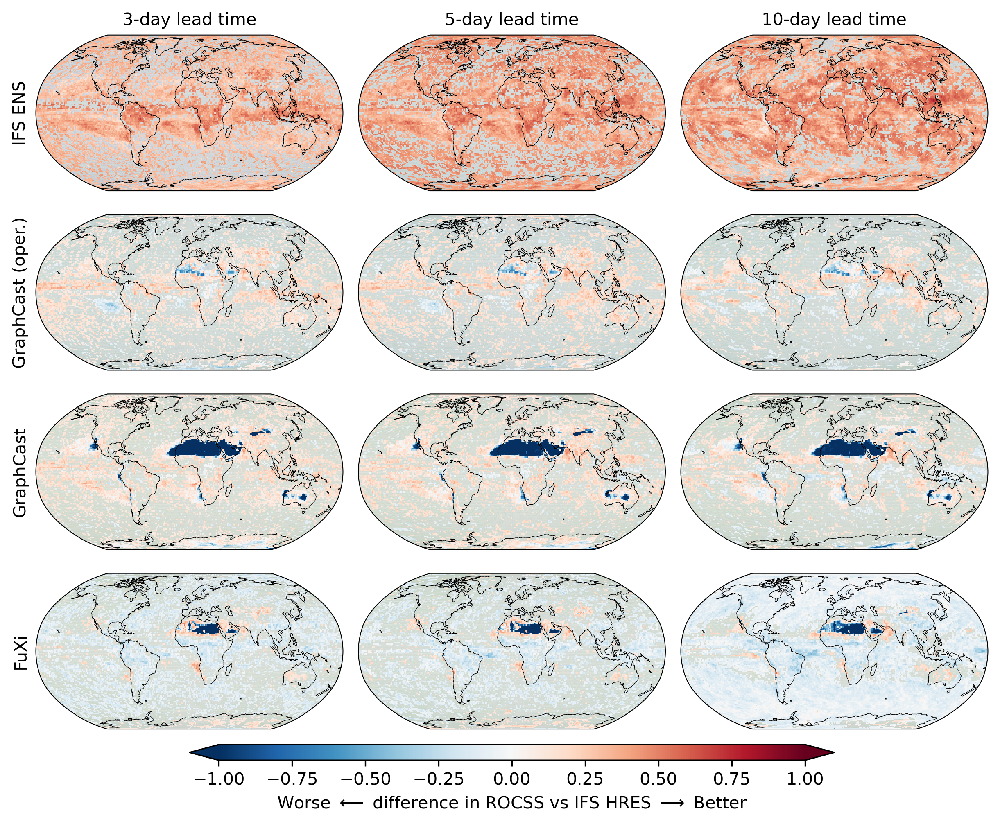

In [69]:
metrics_data = metrics_tp24h_grid


fig = plt.figure(figsize=(10, 7.5), dpi=300)
grid = GridSpec(4, 3, figure=fig, hspace=0.05, wspace=0.05,
        # left=0.1,right=0.9, top=0.9,bottom=0.1,
    )
axes = []
# for i, model_name in enumerate(model_list_rainfall[1:]):
for i, model_name in enumerate(["hres_ens", "graphcast-oper",  "graphcast", "fuxi"]):
    for j, lead_time in enumerate(lead_times):
        ax = fig.add_subplot(grid[i, j], projection=my_projn)
        ax.spines['geo'].set_linewidth(0.5) 
        axes.append(ax)
        metric_model = metrics_data[metric_name].sel(
            lead_time=lead_time, model_name=model_name
            ).transpose("longitude", "latitude")
        if model_name != "hres":
            metric_hres = metrics_data[metric_name].sel(
                    lead_time=lead_time, model_name="hres"
                ).transpose("longitude", "latitude")
            metric_hres = xr.where(metric_hres.isnull(), 0, metric_hres)
            metric_model = metric_model - metric_hres
            # metric_model = (metric_model-metric_hres)/metric_hres * 100
            # metric_model = metric_model / metric_hres
        significant = Significant_Grid_tp24h.sel(model_name=model_name, lead_time=lead_time)
            
        ax.pcolormesh(metric_model["longitude"].data, metric_model["latitude"].data, 
                      metric_model.data.T, transform=ccrs.PlateCarree(), color="lightgrey", alpha=0.1)   
        pcm = ax.pcolormesh(metric_model["longitude"].data, metric_model["latitude"].data,
                            np.where(significant.data, metric_model.data, np.nan).T, transform=ccrs.PlateCarree(),
                            cmap="RdBu_r",vmin=-1,vmax=1,)
        ax.coastlines(linewidth=0.3)
        if i == 0:
            ax.set_title(f"{lead_time}-day lead time", fontsize=10)
        if j == 0:
            ax.text(-0.05, 0.5, model_full_name[model_name], transform=ax.transAxes, 
                    rotation=90, ha="center", va="center", fontsize=10)   
    
axins = ax.inset_axes(bounds=[-1.6, -0.2, 2.1, 0.1], transform=ax.transAxes,)
cbar = fig.colorbar(pcm, cax=axins, orientation='horizontal',extend="both",
                    # shrink=0.9,pad=.04,extend=None
                   )
# cbar.set_label("Better $\mathrm{\longleftarrow}$ % difference in " + metric_name_dict[metric_name]+\
#                " vs IFS HRES $\mathrm{\longrightarrow}$ Worse", fontsize=9)
# cbar.ax.set_xlabel(r"Worse $\mathrm{\longleftarrow}$ BSS (%) with HRES as reference forecasts $\mathrm{\longrightarrow}$ Better", fontsize=10)
cbar.ax.set_xlabel(r"Worse $\mathrm{\longleftarrow}$ difference in " +metric_name_dict[metric_name] + " vs IFS HRES $\mathrm{\longrightarrow}$ Better", fontsize=10)

# cbar.set_ticks([-1.0, -0.5,0,0.5,1.0])

fig.savefig(f"Figures/Map_tp24h_{metric_name_dict[metric_name]}_global_significant.jpg",dpi=300, bbox_inches="tight")

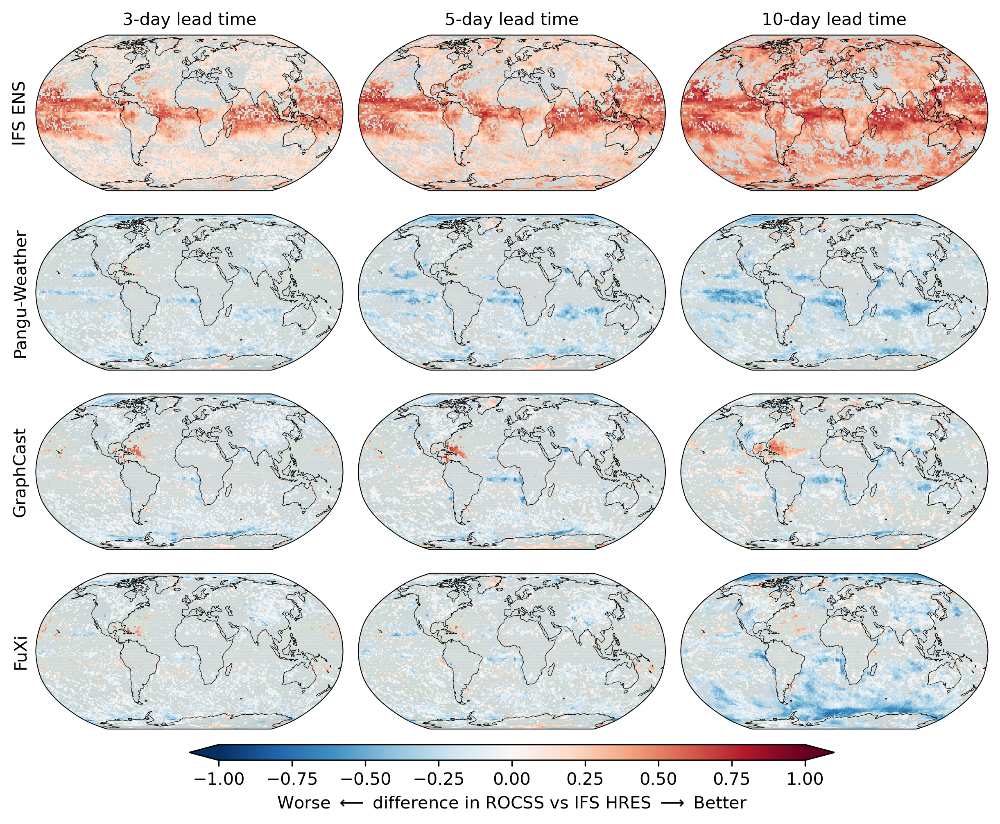

In [70]:
metrics_data = metrics_tx24h_grid


fig = plt.figure(figsize=(10, 7.5), dpi=300)
grid = GridSpec(4, 3, figure=fig, hspace=0.05, wspace=0.05,
        # left=0.1,right=0.9, top=0.9,bottom=0.1,
    )
axes = []
for i, model_name in enumerate(["hres_ens", "pangu", "graphcast", "fuxi"]):
    for j, lead_time in enumerate(lead_times):
        ax = fig.add_subplot(grid[i, j], projection=my_projn)
        ax.spines['geo'].set_linewidth(0.5) 
        axes.append(ax)
        metric_model = metrics_data[metric_name].sel(
                lead_time=lead_time, model_name=model_name
            ).transpose("longitude", "latitude")
        if model_name != "hres":
            metric_hres = metrics_data[metric_name].sel(
                    lead_time=lead_time, model_name="hres"
                ).transpose("longitude", "latitude")
            metric_hres = xr.where(metric_hres.isnull(), 0, metric_hres)
            metric_model = metric_model - metric_hres
            # metric_model = (metric_model-metric_hres)/metric_hres * 100
            # metric_model = metric_model / metric_hres
            
        significant = Significant_Grid_tx24h.sel(model_name=model_name, lead_time=lead_time)
        ax.pcolormesh(metric_model["longitude"].data, metric_model["latitude"].data, 
                      metric_model.data.T, transform=ccrs.PlateCarree(), color="lightgrey", alpha=0.1)   
        pcm = ax.pcolormesh(metric_model["longitude"].data, metric_model["latitude"].data,
                            np.where(significant.data, metric_model.data, np.nan).T, transform=ccrs.PlateCarree(),
                            cmap="RdBu_r", vmin=-1, vmax=1,)
        ax.coastlines(linewidth=0.3)
        if i == 0:
            ax.set_title(f"{lead_time}-day lead time", fontsize=10)
        if j == 0:
            ax.text(-0.05, 0.5, model_full_name[model_name], transform=ax.transAxes, 
                    rotation=90, ha="center", va="center", fontsize=10)   
    
axins = ax.inset_axes(bounds=[-1.6, -0.2, 2.1, 0.1], transform=ax.transAxes,)
cbar = fig.colorbar(pcm, cax=axins, orientation='horizontal',extend="both",
                    # shrink=0.9,pad=.04,extend=None
                   )
# cbar.set_label("Better $\mathrm{\longleftarrow}$ % difference in " + metric_name_dict[metric_name]+\
#                " vs IFS HRES $\mathrm{\longrightarrow}$ Worse", fontsize=9)
# cbar.ax.set_xlabel(r"Worse $\mathrm{\longleftarrow}$ ROCSS (%) with HRES as reference forecasts $\mathrm{\longrightarrow}$ Better", fontsize=10)
cbar.ax.set_xlabel(r"Worse $\mathrm{\longleftarrow}$ difference in " +metric_name_dict[metric_name] + " vs IFS HRES $\mathrm{\longrightarrow}$ Better", fontsize=10)
# cbar.set_ticks([-1.0, -0.5,0,0.5,1.0])

fig.savefig(f"Figures/Map_tx24h_{metric_name_dict[metric_name]}_global_significant.jpg",dpi=300, bbox_inches="tight")

# Forecasts Timeseries

In [ ]:
time_range = pd.date_range(start=datetime.datetime(2020,1,1,0,0,0), end=datetime.datetime(2020,12,31,23,0,0), freq="24h")
time_range

DatetimeIndex(['2020-01-01', '2020-01-02', '2020-01-03', '2020-01-04',
               '2020-01-05', '2020-01-06', '2020-01-07', '2020-01-08',
               '2020-01-09', '2020-01-10',
               ...
               '2020-12-22', '2020-12-23', '2020-12-24', '2020-12-25',
               '2020-12-26', '2020-12-27', '2020-12-28', '2020-12-29',
               '2020-12-30', '2020-12-31'],
              dtype='datetime64[ns]', length=366, freq='24H')

In [ ]:
work_dir = Path.cwd()
work_dir

PosixPath('/data/Experiment/WB2BinaryForecast')

## Load the thresholds

In [ ]:
tx24h_era5_threshold = xr.open_dataset(work_dir / "Threshold_tx24h_150_2020_era5.nc")["2m_temperature"].load()
tx24h_hres0_threshold = xr.open_dataset(work_dir / "Threshold_tx24h_150_2020_hres0.nc")["2m_temperature"].load()
tp24h_era5_threshold = xr.open_dataset(work_dir / "Threshold_tp24h_150_2020_era5.nc")["total_precipitation_24hr"].load()

## Load the raw continuous forecasts

In [ ]:
forecast_data_tx24h = xr.open_dataset(work_dir / "Forecasts_tx24h_150_2020.nc")
forecast_data_tp24h = xr.open_dataset(work_dir / "Forecasts_tp24h_150_2020.nc")

In [ ]:
forecast_data_tx24h

<xarray.Dataset>
Dimensions:         (latitude: 121, longitude: 240, time: 366, lead_time: 10)
Coordinates:
  * latitude        (latitude) float64 -90.0 -88.5 -87.0 ... 87.0 88.5 90.0
  * longitude       (longitude) float64 0.0 1.5 3.0 4.5 ... 355.5 357.0 358.5
  * time            (time) datetime64[ns] 2020-01-01 2020-01-02 ... 2020-12-31
  * lead_time       (lead_time) int64 1 2 3 4 5 6 7 8 9 10
Data variables:
    hres            (lead_time, time, longitude, latitude) float32 ...
    hres_ens_mean   (lead_time, time, longitude, latitude) float32 ...
    era5-forecast   (lead_time, time, longitude, latitude) float32 ...
    pangu-oper      (lead_time, time, longitude, latitude) float32 ...
    graphcast-oper  (lead_time, time, longitude, latitude) float32 ...
    pangu           (lead_time, time, longitude, latitude) float32 ...
    graphcast       (lead_time, time, longitude, latitude) float32 ...
    fuxi            (lead_time, time, longitude, latitude) float32 ...

## Load the raw ensemble forecasts

In [ ]:
from tqdm.notebook import trange, tqdm
def load_hres_ens_t2m24h(lead_time, lat, lon):
    model_name = "hres_ens"
    ens_data = []
    for number in trange(1, 51):
        save_data_path = work_dir / "Data/Data_tx24h_{}_{}_{}_{}d_{}em.nc".format(
            str(resolution).replace(".", "").ljust(3, "0"), str(year), model_name, 
            str(lead_time).zfill(2), str(number).zfill(2))
        test_data = xr.open_dataset(save_data_path)["2m_temperature"].sel(
            longitude=lon, latitude=lat, method='nearest')
        ens_data.append(test_data)
    ens_data = xr.concat(ens_data, dim="number")
    ens_data["number"] = np.arange(1, 51)
    ens_data["time"] = ens_data["time"] - np.timedelta64(1, 'D')
    return ens_data
    # break
def load_hres_ens_tp24h(lead_time, lat, lon):
    model_name = "hres_ens"
    ens_data = []
    for number in trange(1, 51):
        save_data_path = work_dir / "Data/Data_tp24h_{}_{}_{}_{}d_{}em.nc".format(
            str(resolution).replace(".", "").ljust(3, "0"), str(year), model_name, 
            str(lead_time).zfill(2), str(number).zfill(2))
        test_data = xr.open_dataset(save_data_path)["total_precipitation_24hr"].sel(
            longitude=lon, latitude=lat, method='nearest')
        ens_data.append(test_data)
    ens_data = xr.concat(ens_data, dim="number")
    ens_data["number"] = np.arange(1, 51)
    ens_data["time"] = ens_data["time"] - np.timedelta64(1, 'D')
    return ens_data

## Load the ground truth data

In [ ]:
tx24h_era5 = xr.open_dataset(work_dir / "Data/Data_tx24h_150_2020_era5.nc")["2m_temperature"].load()
tx24h_hres0 = xr.open_dataset(work_dir / "Data/Data_tx24h_150_2020_hres0.nc")["2m_temperature"].load()
tp24h_era5 = xr.open_dataset(work_dir / "Data/Data_tp24h_150_2020_era5.nc")["total_precipitation_24hr"].load()

In [ ]:
tx24h_era5["time"] = tx24h_era5["time"] - np.timedelta64(1, 'D')
tx24h_hres0["time"] = tx24h_hres0["time"] - np.timedelta64(1, 'D')
tp24h_era5["time"] = tp24h_era5["time"] - np.timedelta64(1, 'D')

In [ ]:
tx24h_era5_data = tx24h_era5.sel(time=time_range)
tx24h_hres0_data = tx24h_hres0.sel(time=time_range)
tp24h_era5_data = tp24h_era5.sel(time=time_range)

## Load the verification metrics at the grid cell scale

In [ ]:
metrics_tx24h_grid_th = xr.open_dataset(work_dir/"Metrics/Metrics_tx24h_grid_bs_roc.nc")
metrics_tp24h_grid_th = xr.open_dataset(work_dir/"Metrics/Metrics_tp24h_grid_bs_roc.nc")

## Visualize the results

In [ ]:
quantile = 0.9

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import NullFormatter, FixedLocator, FormatStrFormatter, MultipleLocator

In [ ]:
from PIL import Image

In [ ]:
def concatenate_images(image_paths, output_path, direction='horizontal'):
    images = [Image.open(image_path) for image_path in image_paths]
    widths, heights = zip(*(i.size for i in images))
    
    if direction =='horizontal':
        total_width = sum(widths)
        max_height = max(heights)
        new_image = Image.new("RGB",(total_width, max_height))
        x_offset = 0
        for image in images:
            new_image.paste(image,(x_offset,0))
            x_offset += image.width
    elif direction == 'vertical':
        max_width = max(widths)
        total_height = sum(heights)
        new_image = Image.new("RGB",(max_width, total_height))
        y_offset = 0
        for image in images:
            new_image.paste(image,(0,y_offset))
            y_offset += image.height
    else:
        raise ValueError("The direction must be 'horizontal'或'vertical'")
    new_image.save(output_path)

In [ ]:
lead_times = np.arange(1, 11)
model_list_heatwave = ["hres", "hres_ens_mean", "era5-forecast","pangu-oper","graphcast-oper", "pangu", "graphcast","fuxi"]
model_list_rainfall = ["hres", "hres_ens_mean", "graphcast", "graphcast-oper", "fuxi"]
model_full_name = {"graphcast": "GraphCast", "graphcast-oper": "GraphCast (oper.)",
                      "pangu": "Pangu-Weather", "pangu-oper": "Pangu-Weather (oper.)",
                      "hres": "IFS HRES", "hres_ens_mean": "IFS ENS Mean",
                      "era5-forecast": "ERA5 Forecasts",
                      "fuxi": "FuXi"}

metric_name = "ROCSS"

In [ ]:
metrics_tx24h_grid_th

<xarray.Dataset>
Dimensions:     (latitude: 121, longitude: 240, quantile: 9, lead_time: 10,
                 model_name: 9)
Coordinates:
  * latitude    (latitude) float64 -90.0 -88.5 -87.0 -85.5 ... 87.0 88.5 90.0
  * longitude   (longitude) float64 0.0 1.5 3.0 4.5 ... 354.0 355.5 357.0 358.5
  * quantile    (quantile) float64 0.8 0.85 0.9 0.93 0.95 0.96 0.97 0.98 0.99
  * lead_time   (lead_time) int64 1 2 3 4 5 6 7 8 9 10
  * model_name  (model_name) <U14 'hres' 'hres_ens' ... 'graphcast' 'fuxi'
Data variables:
    AUC         (model_name, lead_time, longitude, latitude, quantile) float64 ...
    BS          (model_name, lead_time, longitude, latitude, quantile) float64 ...
    ROCSS       (model_name, lead_time, longitude, latitude, quantile) float64 ...

In [ ]:
metrics_tx24h_grid_th

<xarray.Dataset>
Dimensions:     (latitude: 121, longitude: 240, quantile: 9, lead_time: 10,
                 model_name: 9)
Coordinates:
  * latitude    (latitude) float64 -90.0 -88.5 -87.0 -85.5 ... 87.0 88.5 90.0
  * longitude   (longitude) float64 0.0 1.5 3.0 4.5 ... 354.0 355.5 357.0 358.5
  * quantile    (quantile) float64 0.8 0.85 0.9 0.93 0.95 0.96 0.97 0.98 0.99
  * lead_time   (lead_time) int64 1 2 3 4 5 6 7 8 9 10
  * model_name  (model_name) <U14 'hres' 'hres_ens' ... 'graphcast' 'fuxi'
Data variables:
    AUC         (model_name, lead_time, longitude, latitude, quantile) float64 ...
    BS          (model_name, lead_time, longitude, latitude, quantile) float64 ...
    ROCSS       (model_name, lead_time, longitude, latitude, quantile) float64 ...

In [ ]:
test_ens = load_hres_ens_t2m24h(lead_time, grid["lat"], grid["lon"]) - 273.15
test_ens

  0%|          | 0/50 [00:00<?, ?it/s]

<xarray.DataArray '2m_temperature' (number: 50, time: 713)>
array([[ 2.0741882,  9.832611 , 13.325012 , ...,  9.954498 ,  8.745453 ,
        14.3063965],
       [10.994019 , 14.463226 ,  7.4725037, ...,  0.2427063,  3.755188 ,
        14.91214  ],
       [ 9.546997 , 16.486145 , 10.8828125, ...,  4.8918457, 14.317566 ,
         7.1063538],
       ...,
       [ 6.304016 , 14.271515 , 15.09436  , ..., -1.5571289, 15.968079 ,
         5.2217407],
       [ 7.6872253,  5.4892883,  9.529358 , ..., 10.096191 , 12.895813 ,
        13.206879 ],
       [12.000977 , 13.607208 , 13.222961 , ...,  1.8130493,  9.120453 ,
         8.981537 ]], dtype=float32)
Coordinates:
    latitude   float64 39.0
    longitude  float64 285.0
  * time       (time) datetime64[ns] 2020-01-11 ... 2021-01-01
  * number     (number) int64 1 2 3 4 5 6 7 8 9 ... 42 43 44 45 46 47 48 49 50

31.848077392578148 30.318750000000023


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

27.820458984375023 27.446374511718773


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

18.938928222656273 18.528710937500023


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

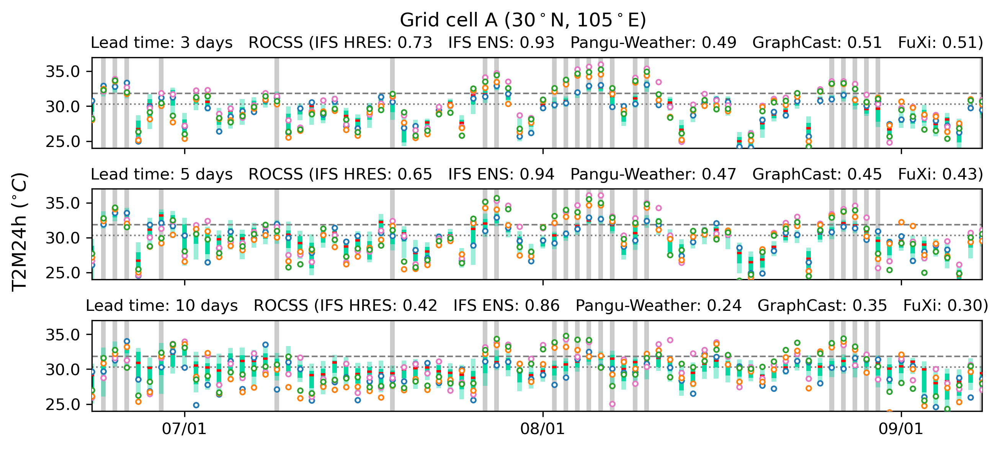

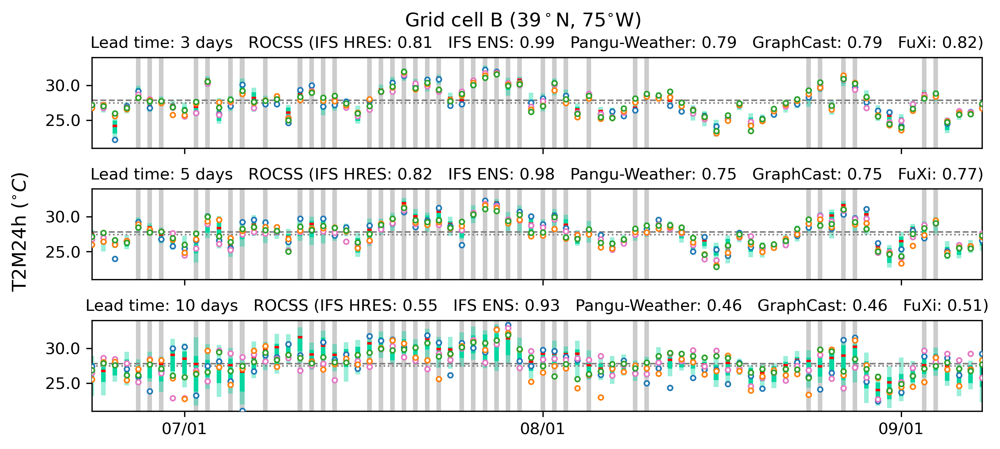

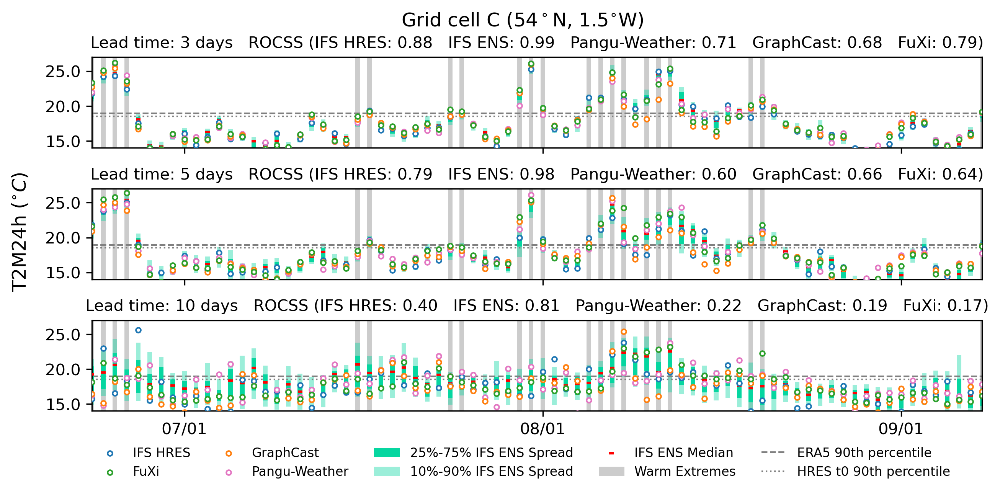

In [ ]:
grid_1 = {"lon": 105, "lat": 30} # China Chongqing
# grid_2 = {"lon": 267, "lat": 34.5} # America Alamo
grid_3 = {"lon": 358.5, "lat": 54} # British
# grid_2 = {"lon": 132, "lat": -15} # Northern Australia
# grid_2 = {"lon": 150, "lat": -31.5} # Southeastern Australia
grid_2 = {"lon": 285, "lat": 39} # Eastern America
# grids = {"A": grid_1, "B": grid_2, "C": grid_3}

grids = {"A": grid_1, "B": grid_2, "C": grid_3}
# grids = {"B": grid_2}
colors = {"hres":plt.get_cmap('tab10')(0), "graphcast":plt.get_cmap('tab10')(1), 
          "fuxi": plt.get_cmap('tab10')(2), "pangu": plt.get_cmap('tab10')(6)}

show_models = ["hres_ens", "hres", "pangu", "graphcast","fuxi"]

fig_path_list = []
for k, (No, grid) in enumerate(grids.items()):

    fig, axes = plt.subplots(3, 1, figsize=(10,4), dpi=300, sharey="row")
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, #wspace=0.05, 
                        hspace=0.45)
 
    grid_era5_data = tx24h_era5_data.sel(longitude=grid["lon"], latitude=grid["lat"], method='nearest')-273.15
    grid_hres0_data = tx24h_hres0_data.sel(longitude=grid["lon"], latitude=grid["lat"], method='nearest')-273.15

    threshold_era5 = tx24h_era5_threshold.sel(longitude=grid["lon"], latitude=grid["lat"], quantile=quantile, method='nearest')-273.15
    threshold_hres0 = tx24h_hres0_threshold.sel(longitude=grid["lon"], latitude=grid["lat"], quantile=quantile, method='nearest')-273.15
    
    print(threshold_era5.data, threshold_hres0.data)
    
    events_time = grid_era5_data[grid_era5_data>threshold_era5].time
    # time_slice = slice(events_time.data[0]-np.timedelta64(4, "D"), events_time.data[-1]+np.timedelta64(4, "D"))
    time_slice = slice(datetime.datetime(2020, 6, 23), datetime.datetime(2020, 9, 8))
    
    for i, lead_time in enumerate([3,5,10]):
        # print(show_models)
        # print("TP", metrics_tx24h_grid_th["TP"].sel(longitude=grid["lon"], latitude=grid["lat"],  
        #             quantile=quantile, lead_time=lead_time, method='nearest').sel(model_name=show_models).data)
        # print("FP", metrics_tx24h_grid_th["FP"].sel(longitude=grid["lon"], latitude=grid["lat"],  
        #             quantile=quantile, lead_time=lead_time, method='nearest').sel(model_name=show_models).data)
        # print("TN", metrics_tx24h_grid_th["TN"].sel(longitude=grid["lon"], latitude=grid["lat"],  
        #             quantile=quantile, lead_time=lead_time, method='nearest').sel(model_name=show_models).data)
        # print("FN", metrics_tx24h_grid_th["FN"].sel(longitude=grid["lon"], latitude=grid["lat"],  
        #             quantile=quantile, lead_time=lead_time, method='nearest').sel(model_name=show_models).data) 
        ax = axes[i]
        # ax.axhline(y=0, ls="--", lw=2, color="grey")
        ax.axhline(y=threshold_era5.data, ls="--", lw=1, color="grey", label="ERA5 90th percentile")
        ax.axhline(y=threshold_hres0.data, ls=":", lw=1, color="grey", label="HRES t0 90th percentile")
        
        hres_ens_metric, hres_metric, pangu_metric, graphcast_metric,fuxi_metric = metrics_tx24h_grid_th[metric_name].sel(
            longitude=grid["lon"], latitude=grid["lat"], quantile=quantile, lead_time=lead_time, method='nearest').sel(
            model_name=show_models).data

        for j, model_name in enumerate(show_models):
        # for model_name in ["hres_ens", "hres"]:
        # for model_name in ["hres_ens", "pangu", "graphcast","fuxi"]:

            
            if model_name == "hres_ens":
                ens_data = load_hres_ens_t2m24h(lead_time, grid["lat"], grid["lon"]) - 273.15
                
                ens_data = ens_data.sel(time=np.intersect1d(time_range, ens_data.time.data))
                ax.scatter(ens_data.time, ens_data.quantile(0.6, dim="number").data, s=8, #lw=1,
                        c="red",label="IFS ENS Median", zorder=4, marker="_")
                ax.bar(ens_data.time, (ens_data.quantile(0.9, dim="number").data - ens_data.quantile(0.1, dim="number").data), 
                       0.4, ens_data.quantile(0.1, dim="number").data, color="#06D6A0", zorder=1, label="10%-90% IFS ENS Spread", alpha=0.4)
                ax.bar(ens_data.time, (ens_data.quantile(0.75, dim="number").data - ens_data.quantile(0.25, dim="number").data),  
                       0.4, ens_data.quantile(0.25, dim="number").data, color="#06D6A0", zorder=2, label="25%-75% IFS ENS Spread", alpha=1)                
                continue
            # color = plt.get_cmap('tab10')(j-1) if j <= 3 else plt.get_cmap('tab10')(j+2)
            color = colors[model_name]
            model_data = forecast_data_tx24h[model_name] #.sel(time=time_slice)
            grid_data = model_data.sel(longitude=grid["lon"], latitude=grid["lat"], lead_time=lead_time, method='nearest') - 273.15
            # ax.plot(grid_data.time, grid_data, lw=1.5, label=model_full_name[model_name], linestyle="dashed", color=color,
            #         marker=".", markerfacecolor="white")
            ax.scatter(grid_data.time, grid_data, label=model_full_name[model_name], color=color,zorder=4+i,
                    marker=".", facecolor="white")
        ax.set_xlim(time_slice.start, time_slice.stop)
        # ax.set_xlim(events_time[0]-np.timedelta64(4, "D"), events_time[-1]+np.timedelta64(4, "D"))
        # ax.set_xlim(grid_data.time.data[0], grid_data.time.data[-1])
        

        # ax.set_ylim(18, 38)
        if k == 0:
            ax.set_ylim(24, 37)
        elif k == 1:
            ax.set_ylim(21, 34)
        else:
            ax.set_ylim(14, 27)
        # ax.set_ylim(0, None)
        ax.bar(grid_era5_data.sel(time=events_time).time, ax.get_ylim()[1]-ax.get_ylim()[0], 
              0.4, ax.get_ylim()[0], color="grey", zorder=0, alpha=0.4, label="Warm Extremes")

        ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
        ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
        ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
        # ax.set_title(f"Lead time: {lead_time} days")
        ax.set_title("Lead time: {} days   {} (IFS HRES: {:.2f}   IFS ENS: {:.2f}   Pangu-Weather: {:.2f}   GraphCast: {:.2f}   FuXi: {:.2f})".format(
            lead_time, metric_name_dict[metric_name], hres_metric, hres_ens_metric, pangu_metric, graphcast_metric,fuxi_metric),
                     fontsize=10,
                     # verticalalignment="center", horizontalalignment="left",
                    )
        ax.set_xticklabels([]) if i != 2 else 0
    handles, labels = ax.get_legend_handles_labels()
    if len(handles) == 10:
        labels = [labels[i] for i in [3, 6,5, 4,  -2, -3, 2, -1, 0, 1]]
        handles = [handles[i] for i in [3, 6,5, 4, -2, -3, 2, -1, 0, 1]]
    ax.legend(handles, labels, frameon=False, loc=(0, -0.8), ncols=5, fontsize=8) if k == 2 else 0
    lon = str(grid['lon'])+"$\mathrm{^\circ}$E" if grid['lon'] <= 180 else str(360-grid['lon'])+"$\mathrm{^{\circ}}$W"
    lat = str(grid['lat'])+"$\mathrm{^\circ}$N" if grid['lat'] >=0 else str(-grid['lat'])+"$\mathrm{^{\circ}}$S"

    fig.suptitle(f"Grid cell {No} ({lat}, {lon})")
    fig.supylabel("T2M24h ($^{\circ}C$)", x=0.055)
    
    fig_path_list.append(f"{No}_ens.jpg")
    fig.savefig(f"{No}_ens.jpg", dpi=300, bbox_inches="tight")
concatenate_images(fig_path_list, work_dir / f"Figures/Timeseries_tx24h_{metric_name}.jpg", 'vertical')

9.130026213824749


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

12.301526963710785


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

7.479317951947451


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

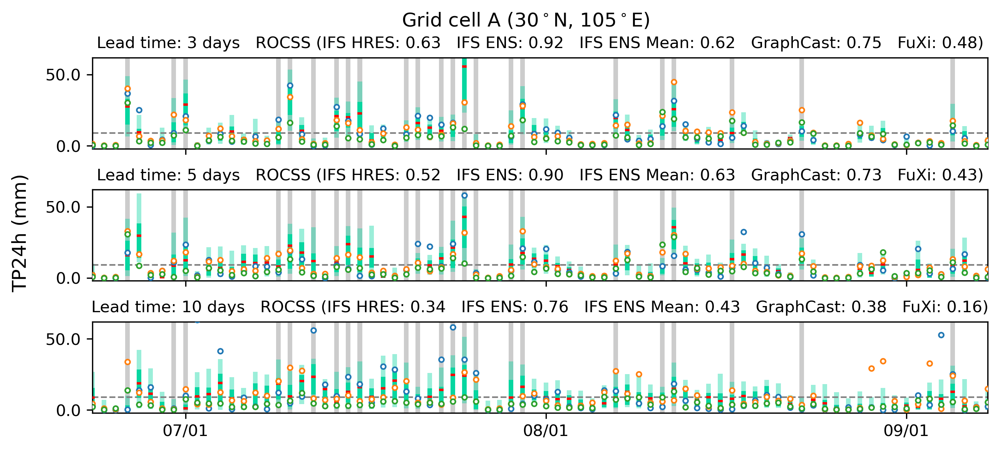

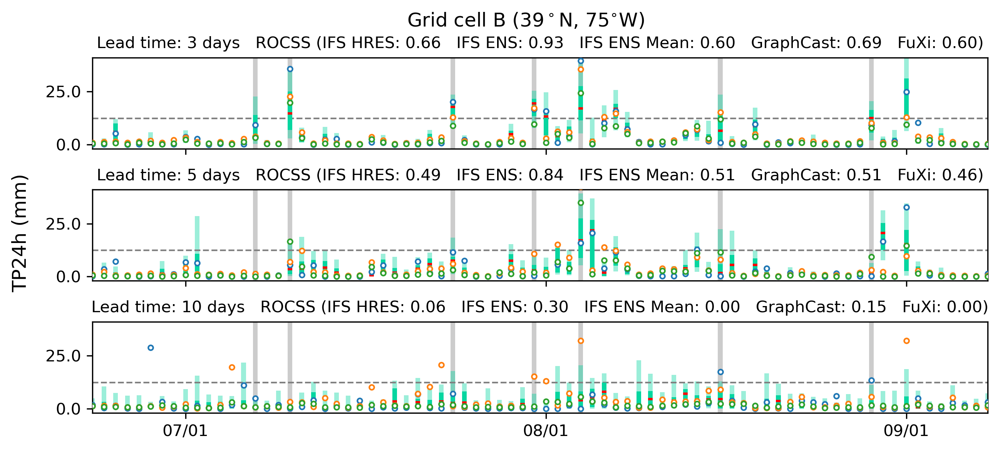

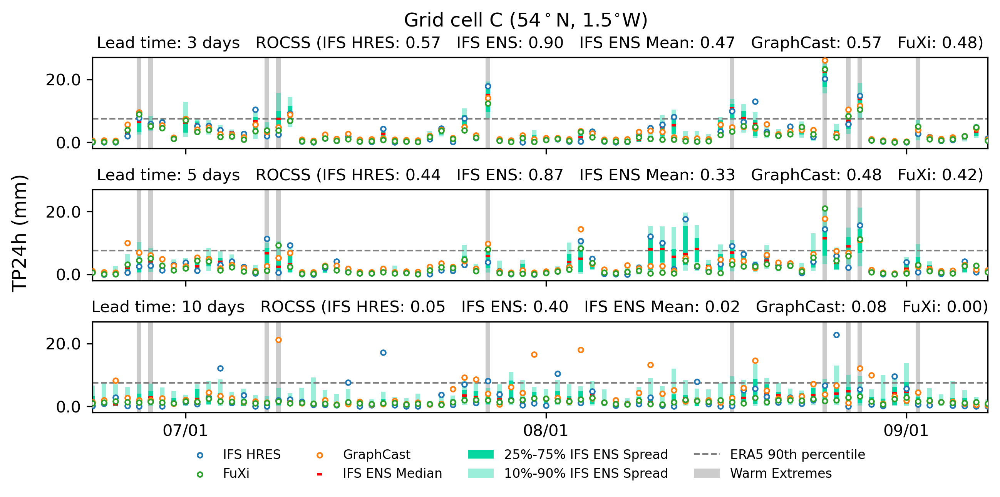

In [ ]:
grid_1 = {"lon": 105, "lat": 30} # China Chongqing
# grid_2 = {"lon": 267, "lat": 34.5} # America Alamo
grid_3 = {"lon": 358.5, "lat": 54} # British
# grid_2 = {"lon": 132, "lat": -15} # Northern Australia
# grid_2 = {"lon": 150, "lat": -31.5} # Southeastern Australia
grid_2 = {"lon": 285, "lat": 39} # Eastern America
# grids = {"A": grid_1, "B": grid_2, "C": grid_3}

grids = {"A": grid_1, "B": grid_2, "C": grid_3}
# grids = {"A": grid_1}


show_models = ["hres_ens", "hres", "graphcast","fuxi"]
colors = {"hres":plt.get_cmap('tab10')(0), "graphcast":plt.get_cmap('tab10')(1), 
          "fuxi": plt.get_cmap('tab10')(2), "pangu": plt.get_cmap('tab10')(6)}

fig_path_list = []
for k, (No, grid) in enumerate(grids.items()):

    fig, axes = plt.subplots(3, 1, figsize=(10,4), dpi=300, sharey="row")
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, #wspace=0.05, 
                        hspace=0.45)
 
    grid_era5_data = tp24h_era5_data.sel(longitude=grid["lon"], latitude=grid["lat"], method='nearest')* 1000
    # grid_hres0_data = tp24h_hres0_data.sel(longitude=grid["lon"], latitude=grid["lat"], method='nearest')-273.15

    threshold_era5 = tp24h_era5_threshold.sel(longitude=grid["lon"], latitude=grid["lat"], quantile=quantile, method='nearest')* 1000
    # threshold_hres0 = tp24h_hres0_threshold.sel(longitude=grid["lon"], latitude=grid["lat"], quantile=quantile, method='nearest')-273.15
    
    print(threshold_era5.data)
    
    events_time = grid_era5_data[grid_era5_data>threshold_era5].time
    # time_slice = slice(events_time.data[0]-np.timedelta64(4, "D"), events_time.data[-1]+np.timedelta64(4, "D"))
    time_slice = slice(datetime.datetime(2020, 6, 23), datetime.datetime(2020, 9, 8))
    for i, lead_time in enumerate([3,5,10]):
        # print(show_models)
        # print("TP", metrics_tp24h_grid_th["TP"].sel(longitude=grid["lon"], latitude=grid["lat"],  
        #             quantile=quantile, lead_time=lead_time, method='nearest').sel(model_name=show_models).data)
        # print("FP", metrics_tp24h_grid_th["FP"].sel(longitude=grid["lon"], latitude=grid["lat"],  
        #             quantile=quantile, lead_time=lead_time, method='nearest').sel(model_name=show_models).data)
        # print("TN", metrics_tp24h_grid_th["TN"].sel(longitude=grid["lon"], latitude=grid["lat"],  
        #             quantile=quantile, lead_time=lead_time, method='nearest').sel(model_name=show_models).data)
        # print("FN", metrics_tp24h_grid_th["FN"].sel(longitude=grid["lon"], latitude=grid["lat"],  
        #             quantile=quantile, lead_time=lead_time, method='nearest').sel(model_name=show_models).data) 
        ax = axes[i]
        # ax.axhline(y=0, ls="--", lw=2, color="grey")
        ax.axhline(y=threshold_era5.data, ls="--", lw=1, color="grey", label="ERA5 90th percentile")
        # ax.axhline(y=threshold_hres0.data, ls=":", lw=1, color="grey", label="HRES t0 90th percentile")
        
        hres_ens_metric, hres_metric, graphcast_metric, fuxi_metric, hres_ens_mean_metric = metrics_tp24h_grid_th[metric_name].sel(
            longitude=grid["lon"], latitude=grid["lat"], quantile=quantile, lead_time=lead_time, method='nearest').sel(
            model_name=show_models+["hres_ens_mean"]).data
        for j, model_name in enumerate(show_models):
        # for model_name in ["hres_ens", "hres"]:
        # for model_name in ["hres_ens", "pangu", "graphcast","fuxi"]:

            
            if model_name == "hres_ens":
                ens_data = load_hres_ens_tp24h(lead_time, grid["lat"], grid["lon"]) * 1000
                
                ens_data = ens_data.sel(time=np.intersect1d(time_range, ens_data.time.data))
                ax.scatter(ens_data.time, ens_data.quantile(0.6, dim="number").data, s=8, #lw=1,
                        c="red",label="IFS ENS Median", zorder=4, marker="_")
                ax.bar(ens_data.time, (ens_data.quantile(0.9, dim="number").data - ens_data.quantile(0.1, dim="number").data), 
                       0.4, ens_data.quantile(0.1, dim="number").data, color="#06D6A0", zorder=1, label="10%-90% IFS ENS Spread", alpha=0.4)
                ax.bar(ens_data.time, (ens_data.quantile(0.75, dim="number").data - ens_data.quantile(0.25, dim="number").data),  
                       0.4, ens_data.quantile(0.25, dim="number").data, color="#06D6A0", zorder=2, label="25%-75% IFS ENS Spread", alpha=1)                
                continue
            color = plt.get_cmap('tab10')(j-1) if j <= 3 else plt.get_cmap('tab10')(j+2)
            color = colors[model_name]
            model_data = forecast_data_tp24h[model_name]  * 1000 #.sel(time=time_slice)
            grid_data = model_data.sel(longitude=grid["lon"], latitude=grid["lat"], lead_time=lead_time, method='nearest')
            ax.scatter(grid_data.time, grid_data, label=model_full_name[model_name], color=color,zorder=4+i,
                    marker=".", facecolor="white")
        ax.set_xlim(time_slice.start, time_slice.stop) 
        # ax.set_ylim(-2, ax.get_ylim()[1])
        # ax.set_ylim(18, 38)
        if k == 0:
            ax.set_ylim(-2, 62)
        elif k == 1:
            ax.set_ylim(-2, 41)
        else:
            ax.set_ylim(-2, 27)
        # ax.set_ylim(0, None)
        ax.bar(grid_era5_data.sel(time=events_time).time, ax.get_ylim()[1]-ax.get_ylim()[0], 
              0.4, ax.get_ylim()[0], color="grey", zorder=0, alpha=0.4, label="Warm Extremes")

        ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
        ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
        ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
        # ax.set_title(f"Lead time: {lead_time} days")

        ax.set_title("Lead time: {} days   {} (IFS HRES: {:.2f}   IFS ENS: {:.2f}   IFS ENS Mean: {:.2f}   GraphCast: {:.2f}   FuXi: {:.2f})".format(
            lead_time, metric_name_dict[metric_name], hres_metric, hres_ens_metric, hres_ens_mean_metric, graphcast_metric,fuxi_metric),
                     fontsize=10,
                     # verticalalignment="center", horizontalalignment="left",
                    )
        ax.set_xticklabels([]) if i != 2 else 0
    handles, labels = ax.get_legend_handles_labels()
    if len(handles) == 8:
        labels = [labels[i] for i in [2, 4, 3, 1, 6,5, 0, -1]]
        handles = [handles[i] for i in [2, 4, 3, 1, 6,5, 0, -1]]
    ax.legend(handles, labels, frameon=False, loc=(0.1, -0.8), ncols=4, fontsize=8) if k == 2 else 0
    lon = str(grid['lon'])+"$\mathrm{^\circ}$E" if grid['lon'] <= 180 else str(360-grid['lon'])+"$\mathrm{^{\circ}}$W"
    lat = str(grid['lat'])+"$\mathrm{^\circ}$N" if grid['lat'] >=0 else str(-grid['lat'])+"$\mathrm{^{\circ}}$S"

    fig.suptitle(f"Grid cell {No} ({lat}, {lon})")
    fig.supylabel("TP24h (mm)", x=0.055)
    
    fig_path_list.append(f"{No}_ens.jpg")
    fig.savefig(f"{No}_ens.jpg", dpi=300, bbox_inches="tight")
concatenate_images(fig_path_list, work_dir/ f"Figures/Timeseries_tp24h_{metric_name}.jpg", 'vertical')